# Stroke Prediction Dataset
---

# Installs

In [ ]:
!pip install -q autoviz
!pip install -q -U --pre pycaret

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pydocstyle 6.2.3 requires importlib-metadata<5.0.0,>=2.0.0; python_version < "3.8", but you have importlib-metadata 6.0.0 which is incompatible.
librosa 0.10.0 requires soundfile>=0.12.1, but you have soundfile 0.11.0 which is incompatible.
ibis-framework 2.1.1 requires importlib-metadata<5,>=4; python_version < "3.8", but you have importlib-metadata 6.0.0 which is incompatible.
flake8 5.0.4 requires importlib-metadata<4.3,>=1.1.0; python_version < "3.8", but you have importlib-metadata 6.0.0 which is incompatible.
cmudict 1.0.13 requires importlib-metadata<6.0.0,>=5.1.0, but you have importlib-metadata 6.0.0 which is incompatible.


# Imports

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from autoviz.classify_method import data_cleaning_suggestions ,data_suggestions

from pycaret  import regression
from sklearn.model_selection import cross_val_score

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


# Data Loading

In [ ]:
df = pd.read_csv('/kaggle/input/stroke-prediction-dataset/healthcare-dataset-stroke-data.csv')

In [ ]:
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [ ]:
df.tail()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0
5109,44679,Female,44.0,0,0,Yes,Govt_job,Urban,85.28,26.2,Unknown,0


In [ ]:
df.shape

(5110, 12)

# EDA

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [ ]:
df.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [ ]:
df.nunique()

id                   5110
gender                  3
age                   104
hypertension            2
heart_disease           2
ever_married            2
work_type               5
Residence_type          2
avg_glucose_level    3979
bmi                   418
smoking_status          4
stroke                  2
dtype: int64

In [ ]:
df.drop('id', axis = 1, inplace = True)

In [ ]:
df.dtypes

gender                object
age                  float64
hypertension           int64
heart_disease          int64
ever_married          object
work_type             object
Residence_type        object
avg_glucose_level    float64
bmi                  float64
smoking_status        object
stroke                 int64
dtype: object

In [ ]:
df['bmi'] = df['bmi'].astype(float)

# Handling Categorical Values

In [ ]:
# get list of categorical columns
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
cat_cols

['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in cat_cols: 
    # Encode values in training set
    le.fit(df[col])
    df[col] = le.transform(df[col])

In [ ]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.0,0,1,1,2,1,228.69,36.6,1,1
1,0,61.0,0,0,1,3,0,202.21,NaN,2,1
2,1,80.0,0,1,1,2,0,105.92,32.5,2,1
3,0,49.0,0,0,1,2,1,171.23,34.4,3,1
4,0,79.0,1,0,1,3,0,174.12,24.0,2,1
...,...,...,...,...,...,...,...,...,...,...,...
5105,0,80.0,1,0,1,2,1,83.75,NaN,2,0
5106,0,81.0,0,0,1,3,1,125.20,40.0,2,0
5107,0,35.0,0,0,1,3,0,82.99,30.6,2,0
5108,1,51.0,0,0,1,2,0,166.29,25.6,1,0


# Handling Null Values

In [ ]:
df.isnull().any()

gender               False
age                  False
hypertension         False
heart_disease        False
ever_married         False
work_type            False
Residence_type       False
avg_glucose_level    False
bmi                   True
smoking_status       False
stroke               False
dtype: bool

In [ ]:
df.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

In [ ]:
df.fillna('29', inplace = True)

In [ ]:
df.isnull().sum()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

In [ ]:
df.isnull().any()

gender               False
age                  False
hypertension         False
heart_disease        False
ever_married         False
work_type            False
Residence_type       False
avg_glucose_level    False
bmi                  False
smoking_status       False
stroke               False
dtype: bool

# Correlation

In [ ]:
df.corr()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,smoking_status,stroke
gender,1.000000,-0.028202,0.020994,0.085447,-0.031005,0.056422,-0.006738,0.055180,-0.062581,0.008929
age,-0.028202,1.000000,0.276398,0.263796,0.679125,-0.361642,0.014180,0.238171,0.265199,0.245257
hypertension,0.020994,0.276398,1.000000,0.108306,0.164243,-0.051761,-0.007913,0.174474,0.111038,0.127904
heart_disease,0.085447,0.263796,0.108306,1.000000,0.114644,-0.028023,0.003092,0.161857,0.048460,0.134914
ever_married,-0.031005,0.679125,0.164243,0.114644,1.000000,-0.352722,0.006261,0.155068,0.259647,0.108340
work_type,0.056422,-0.361642,-0.051761,-0.028023,-0.352722,1.000000,-0.007316,-0.050513,-0.305927,-0.032316
Residence_type,-0.006738,0.014180,-0.007913,0.003092,0.006261,-0.007316,1.000000,-0.004946,0.008237,0.015458
avg_glucose_level,0.055180,0.238171,0.174474,0.161857,0.155068,-0.050513,-0.004946,1.000000,0.063437,0.131945
smoking_status,-0.062581,0.265199,0.111038,0.048460,0.259647,-0.305927,0.008237,0.063437,1.000000,0.028123
stroke,0.008929,0.245257,0.127904,0.134914,0.108340,-0.032316,0.015458,0.131945,0.028123,1.000000


In [ ]:
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.0,0,1,1,2,1,228.69,36.6,1,1
1,0,61.0,0,0,1,3,0,202.21,29,2,1
2,1,80.0,0,1,1,2,0,105.92,32.5,2,1
3,0,49.0,0,0,1,2,1,171.23,34.4,3,1
4,0,79.0,1,0,1,3,0,174.12,24.0,2,1
...,...,...,...,...,...,...,...,...,...,...,...
5105,0,80.0,1,0,1,2,1,83.75,29,2,0
5106,0,81.0,0,0,1,3,1,125.20,40.0,2,0
5107,0,35.0,0,0,1,3,0,82.99,30.6,2,0
5108,1,51.0,0,0,1,2,0,166.29,25.6,1,0


# Class Distribution

In [ ]:
# Count the number of instances in each class
class_counts = df['stroke'].value_counts()

# Print the class distribution
print('Class distribution:')
print(class_counts)

Class distribution:
0    4861
1     249
Name: stroke, dtype: int64


In [ ]:
data_cleaning_suggestions(df)

Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
avg_glucose_level,3979,float64,0,0.000000,77.866928,0,skewed: cap or drop outliers
bmi,419,object,0,0.000000,8.199609,1,"combine rare categories, fix mixed data types"
age,104,float64,0,0.000000,2.035225,0,
work_type,5,int64,0,0.000000,0.097847,0,
smoking_status,4,int64,0,0.000000,0.078278,0,
gender,3,int64,0,0.000000,0.058708,0,
hypertension,2,int64,0,0.000000,0.039139,0,
heart_disease,2,int64,0,0.000000,0.039139,0,
ever_married,2,int64,0,0.000000,0.039139,0,
Residence_type,2,int64,0,0.000000,0.039139,0,


# Visualizations

# Correlation

<AxesSubplot:>

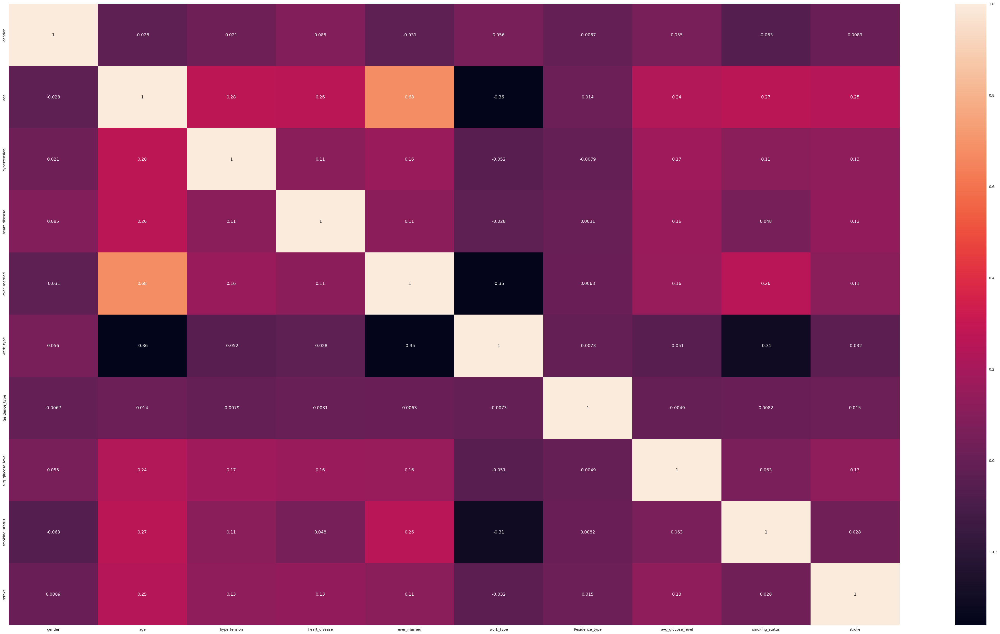

In [ ]:
plt.figure(figsize=(50,30))
sns.heatmap(df.corr(),annot=True)

# Pair Plots

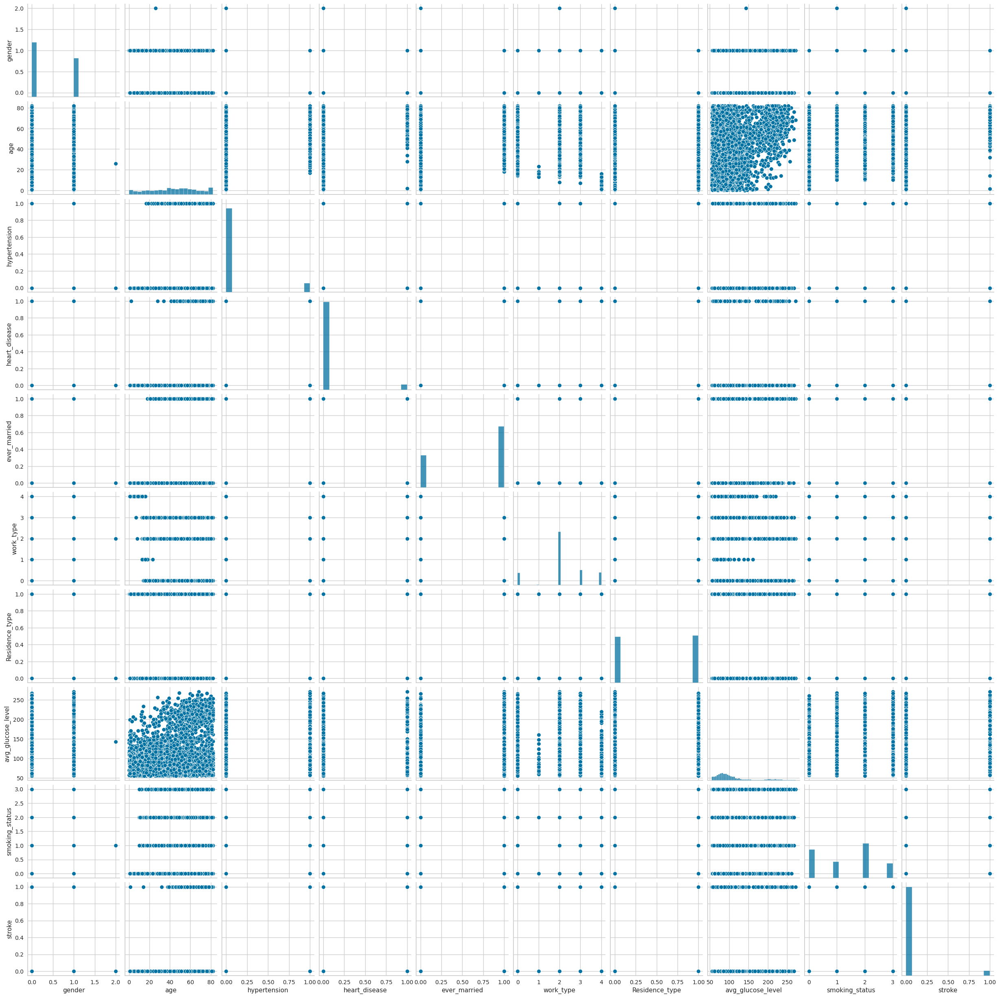

In [ ]:
sns.pairplot(df)

# Other Plots

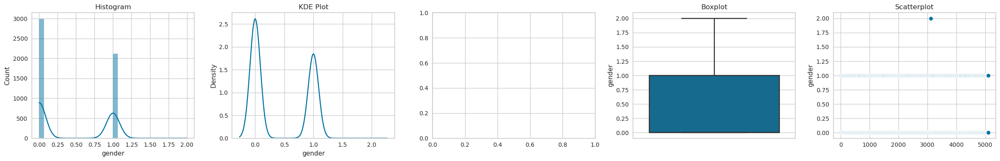

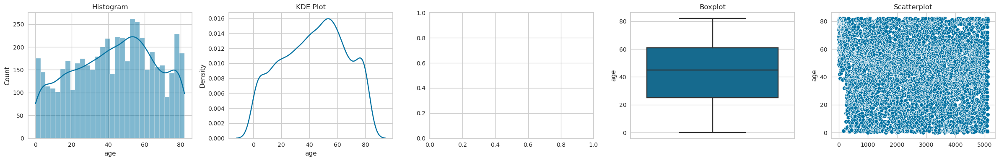

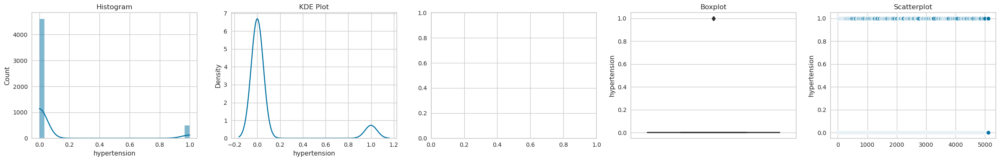

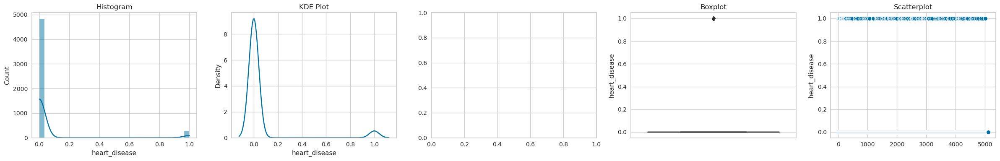

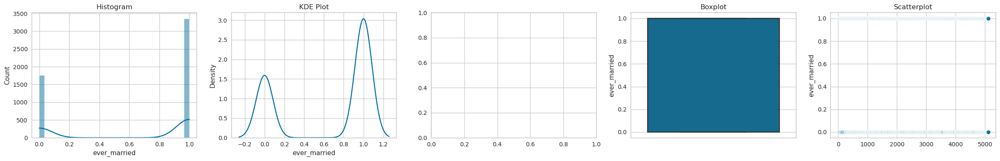

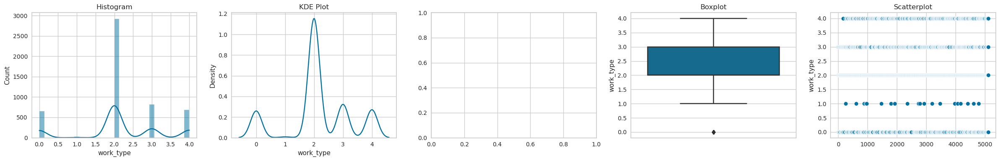

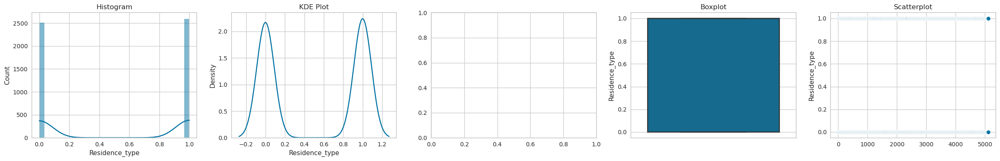

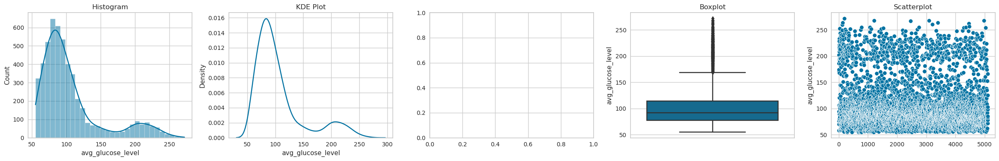

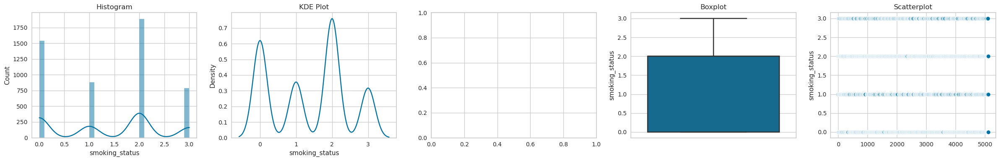

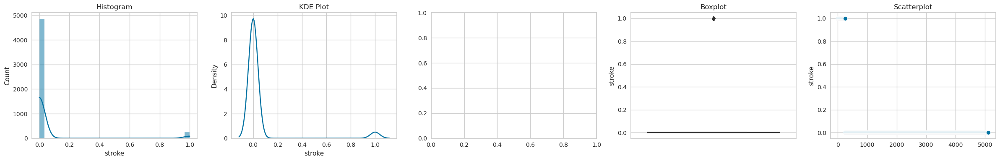

In [ ]:
def plots(df, variable):
  if df[variable].dtype != object:
    # define figure size
    fig, ax = plt.subplots(1, 5, figsize=(24, 4))
    
    # histogram
    sns.histplot(df[variable], bins=30, kde=True, ax=ax[0])
    ax[0].set_title('Histogram')
    
    # KDE plot
    sns.kdeplot(df[variable], ax=ax[1])
    ax[1].set_title('KDE Plot')
    
    # boxplot
    sns.boxplot(y=df[variable], ax=ax[3])
    ax[3].set_title('Boxplot')
    
    # scatterplot
    sns.scatterplot(x=df.index, y=df[variable], ax=ax[4])
    ax[4].set_title('Scatterplot')
    
    plt.tight_layout()
    plt.show()

for i in df.columns:
    plots(df ,i)

In [ ]:
X = df.drop('stroke', axis = 1)
y = df['stroke']

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Balancing Classes Using SMOTE

In [ ]:
from imblearn.over_sampling import SMOTE

# Instantiate SMOTE
sm = SMOTE(random_state=42)

# Fit SMOTE to training data
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

# Print class distribution of original and resampled data
print('Class distribution before resampling:', y_train.value_counts())
print('Class distribution after resampling:', y_train_res.value_counts())

Class distribution before resampling: 0    3901
1     187
Name: stroke, dtype: int64
Class distribution after resampling: 0    3901
1    3901
Name: stroke, dtype: int64


# Comparing Classification Models

In [ ]:
# combine X_train_res and y_train_res
train_data = pd.concat([X_train_res, y_train_res], axis=1)

In [ ]:
from pycaret.classification import *
s = setup(data=train_data, target='stroke', session_id=123, normalize=True)

,Description,Value
0,Session id,123
1,Target,stroke
2,Target type,Binary
3,Original data shape,"(7802, 11)"
4,Transformed data shape,"(7802, 11)"
5,Transformed train set shape,"(5461, 11)"
6,Transformed test set shape,"(2341, 11)"
7,Numeric features,9
8,Categorical features,1
9,Preprocess,True


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9529,0.9913,0.9638,0.9436,0.9535,0.9059,0.9063,0.4920
lightgbm,Light Gradient Boosting Machine,0.9482,0.9889,0.9619,0.9364,0.9489,0.8964,0.8969,0.4900
rf,Random Forest Classifier,0.9449,0.9884,0.9656,0.9273,0.9460,0.8898,0.8906,0.5820
catboost,CatBoost Classifier,0.9374,0.9836,0.9627,0.9165,0.9389,0.8747,0.8760,3.5600
et,Extra Trees Classifier,0.9361,0.9883,0.9608,0.9157,0.9377,0.8722,0.8734,0.4790
dt,Decision Tree Classifier,0.9046,0.9046,0.9227,0.8908,0.9064,0.8092,0.8099,0.0800
gbc,Gradient Boosting Classifier,0.8751,0.9510,0.9055,0.8537,0.8788,0.7502,0.7518,0.4730
knn,K Neighbors Classifier,0.8726,0.9380,0.9487,0.8236,0.8816,0.7451,0.7541,0.1360
ada,Ada Boost Classifier,0.8378,0.9239,0.8605,0.8232,0.8413,0.6755,0.6764,0.3140
qda,Quadratic Discriminant Analysis,0.8196,0.8973,0.8682,0.7916,0.8280,0.6393,0.6425,0.0940


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=-1, num_parallel_tree=1, objective='binary:logistic',
              predictor='auto', random_state=123, reg_alpha=0, ...)

In [ ]:
xg = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9525,0.9890,0.9380,0.9662,0.9519,0.9049,0.9053
1,0.9597,0.9950,0.9780,0.9435,0.9604,0.9194,0.9200
2,0.9359,0.9879,0.9487,0.9250,0.9367,0.8718,0.8721
3,0.9597,0.9911,0.9707,0.9498,0.9601,0.9194,0.9196
4,0.9560,0.9924,0.9597,0.9527,0.9562,0.9121,0.9121
5,0.9542,0.9922,0.9670,0.9429,0.9548,0.9084,0.9087
6,0.9524,0.9898,0.9634,0.9427,0.9529,0.9048,0.9050
7,0.9451,0.9902,0.9670,0.9263,0.9462,0.8901,0.8910
8,0.9615,0.9924,0.9670,0.9565,0.9617,0.9231,0.9231


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
from sklearn.model_selection import cross_val_score

# Evaluate the ensemble model using cross-validation
scores = cross_val_score(xg, X_train_res, y_train_res, cv=20)

# Predictions

In [ ]:
preds = predict_model(xg)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.9551,0.9929,0.9632,0.9479,0.9555,0.9103,0.9104


In [ ]:
preds

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,prediction_label,prediction_score
5461,0,60.076889,0,0,1,2,1,209.653107,44.892300,2,1,1,0.9839
5462,0,30.000000,0,0,0,2,0,118.620003,29.700000,0,0,0,0.9986
5463,0,72.239174,0,0,1,0,0,131.361145,28.201827,1,1,1,0.9911
5464,0,72.000000,0,0,1,3,1,239.820007,35.800000,2,0,0,0.9953
5465,0,56.568813,0,0,1,0,0,161.600327,27.311376,0,1,1,0.9895
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7797,1,69.000000,0,0,1,2,0,93.809998,28.500000,0,1,0,0.5124
7798,0,77.788902,0,0,0,2,0,61.406273,29.000000,1,1,1,0.9984
7799,1,14.000000,0,0,0,2,0,164.699997,26.300000,0,0,0,0.9998
7800,0,72.371681,0,0,1,0,0,131.619995,28.722122,1,1,1,0.9905


# ROC Curve


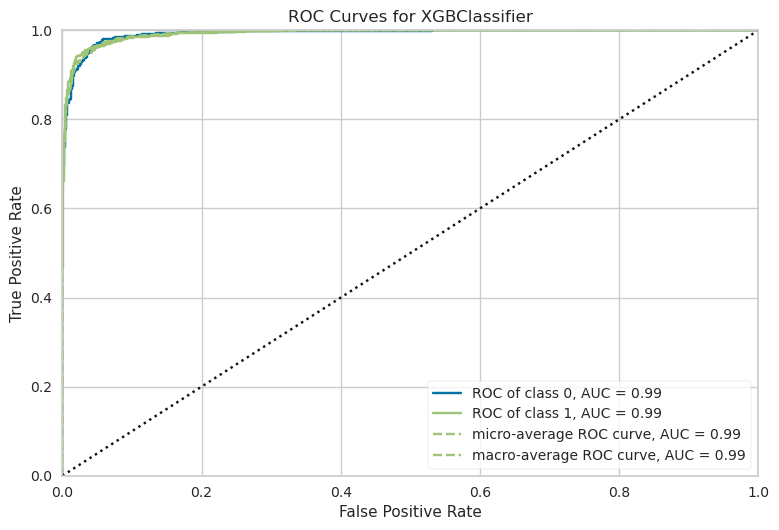

In [ ]:
plot_model(xg)

# Error Plot

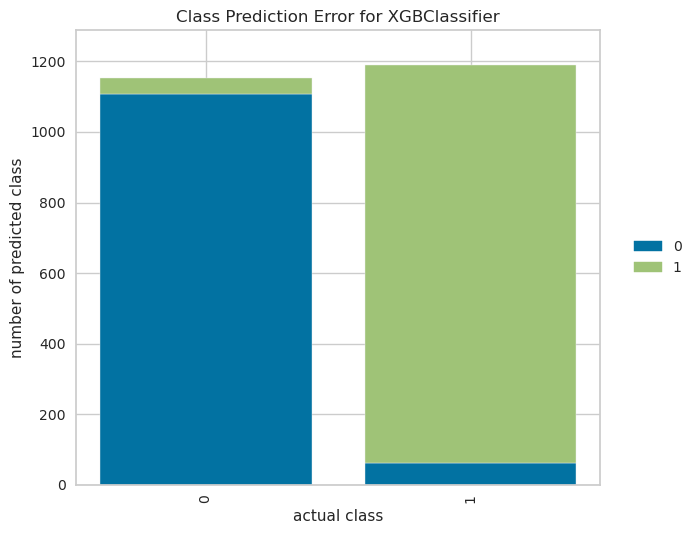

In [ ]:
plot_model(xg, plot = 'error')

# Learning Curve

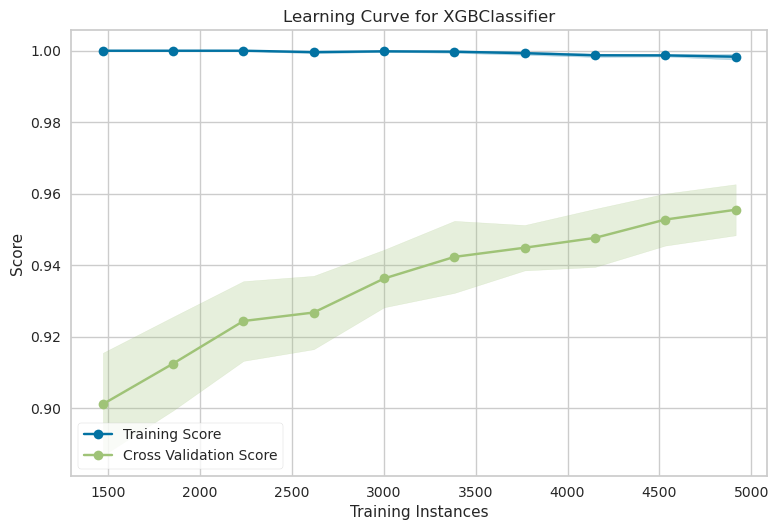

In [ ]:
plot_model(xg, plot = 'learning')

# Validation Curve

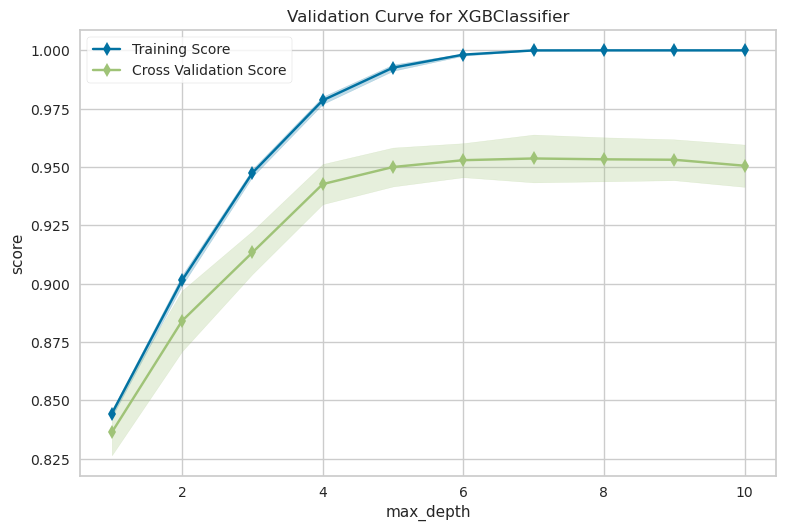

In [ ]:
plot_model(xg, plot = 'vc')